Informasi Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1088 entries, 0 to 1087
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Provinsi      1088 non-null   object 
 1   Kota          1088 non-null   object 
 2   Kecamatan     1088 non-null   object 
 3   Kelurahan     1088 non-null   object 
 4   ID Merchant   1086 non-null   object 
 5   Nama Pemilik  1088 non-null   object 
 6   Alamat        1088 non-null   object 
 7   Koordinat     1088 non-null   object 
 8   Latitude      1088 non-null   float64
 9   Longitude     1088 non-null   float64
dtypes: float64(2), object(8)
memory usage: 85.1+ KB
None

Sample Data:
  Provinsi                    Kota Kecamatan Kelurahan  ID Merchant  \
0   BANTEN  KOTA TANGERANG SELATAN   CIPUTAT  CIPAYUNG  3,15439E+14   
1   BANTEN  KOTA TANGERANG SELATAN   CIPUTAT  CIPAYUNG  3,15439E+14   
2   BANTEN  KOTA TANGERANG SELATAN   CIPUTAT  CIPAYUNG  3,15417E+14   
3 

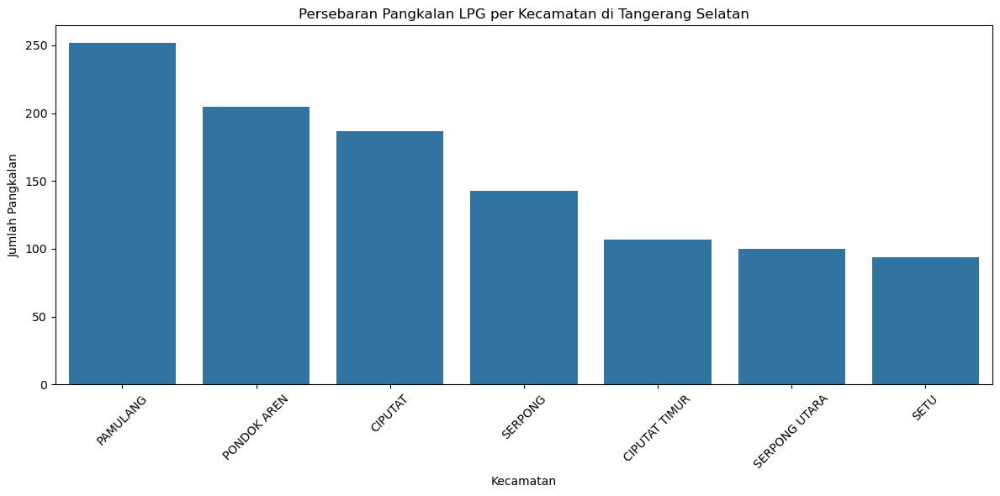


Jumlah Pangkalan per Kecamatan telah disimpan ke 'persebaran_kecamatan.csv' dan 'persebaran_kecamatan.xlsx'.


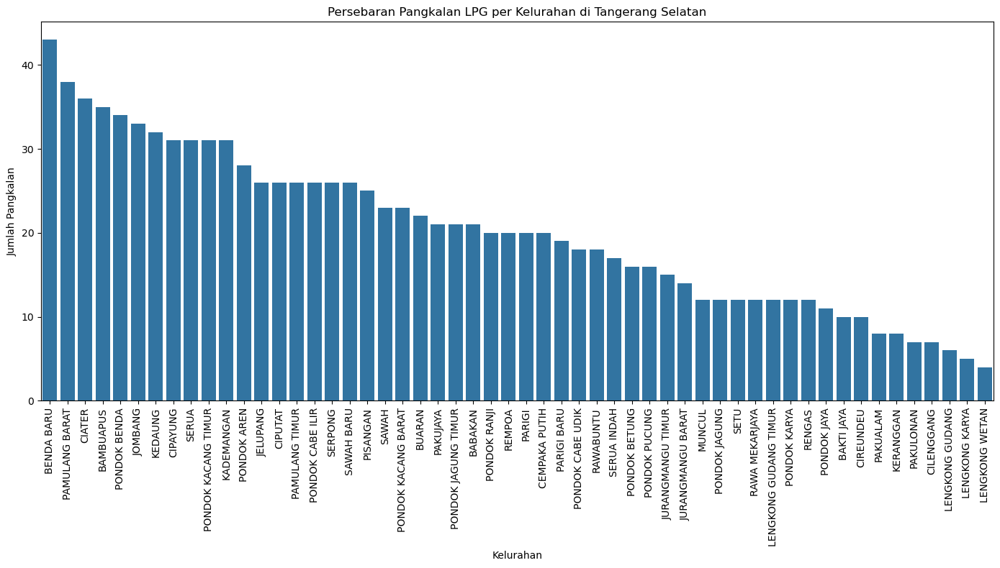


Jumlah Pangkalan per Kelurahan telah disimpan ke 'persebaran_kelurahan.csv' dan 'persebaran_kelurahan.xlsx'.


In [167]:
# Import library yang dibutuhkan
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Baca data dengan delimiter yang benar
df = pd.read_csv('merchants_tangsel_final.csv', 
                 sep=';',  # Gunakan titik koma sebagai pemisah
                 quotechar='"',  # Gunakan tanda kutip untuk mengelompokkan teks
                 encoding='utf-8')  # Specify encoding

# Bersihkan data koordinat
df['Koordinat'] = df['Koordinat'].str.replace('"', '')  # Hapus tanda kutip
df[['Latitude', 'Longitude']] = df['Koordinat'].str.split(',', expand=True).apply(lambda x: x.str.strip())

# Konversi koordinat ke float
df['Latitude'] = pd.to_numeric(df['Latitude'])
df['Longitude'] = pd.to_numeric(df['Longitude'])

# Tampilkan informasi dataset
print("Informasi Dataset:")
print(df.info())
print("\nSample Data:")
print(df.head())

# 1. Visualisasi Persebaran per Kecamatan
plt.figure(figsize=(12, 6))
district_counts = df['Kecamatan'].value_counts()
sns.barplot(x=district_counts.index, y=district_counts.values)
plt.title('Persebaran Pangkalan LPG per Kecamatan di Tangerang Selatan')
plt.xticks(rotation=45)
plt.ylabel('Jumlah Pangkalan')
plt.xlabel('Kecamatan')
plt.tight_layout()

# Simpan grafik persebaran per kecamatan
plt.savefig('persebaran_kecamatan.jpg', format='jpg', dpi=300)  # Untuk JPG
plt.savefig('persebaran_kecamatan.png', format='png', dpi=300)  # Untuk PNG
plt.show()

# Format tabel untuk jumlah pangkalan per kecamatan
district_table = pd.DataFrame({
    'Kecamatan': district_counts.index,
    'Jumlah Pangkalan': district_counts.values,
    'Persentase Distribusi': (district_counts / len(df) * 100).round(2)
})

# Simpan tabel ke CSV
district_table.to_csv('persebaran_kecamatan.csv', index=False, encoding='utf-8')
# Simpan tabel ke Excel
district_table.to_excel('persebaran_kecamatan.xlsx', index=False)

print("\nJumlah Pangkalan per Kecamatan telah disimpan ke 'persebaran_kecamatan.csv' dan 'persebaran_kecamatan.xlsx'.")

# 2. Visualisasi Persebaran per Kelurahan
plt.figure(figsize=(14, 8))
village_counts = df['Kelurahan'].value_counts()
sns.barplot(x=village_counts.index, y=village_counts.values)
plt.title('Persebaran Pangkalan LPG per Kelurahan di Tangerang Selatan')
plt.xticks(rotation=90)
plt.ylabel('Jumlah Pangkalan')
plt.xlabel('Kelurahan')
plt.tight_layout()

# Simpan grafik persebaran per kelurahan
plt.savefig('persebaran_kelurahan.jpg', format='jpg', dpi=300)  # Untuk JPG
plt.savefig('persebaran_kelurahan.png', format='png', dpi=300)  # Untuk PNG
plt.show()

# Format tabel untuk jumlah pangkalan per kelurahan
village_table = pd.DataFrame({
    'Kelurahan': village_counts.index,
    'Jumlah Pangkalan': village_counts.values,
    'Persentase Distribusi': (village_counts / len(df) * 100)
}).round(2)

# Simpan tabel ke CSV
village_table.to_csv('persebaran_kelurahan.csv', index=False, encoding='utf-8')
# Simpan tabel ke Excel
village_table.to_excel('persebaran_kelurahan.xlsx', index=False)

print("\nJumlah Pangkalan per Kelurahan telah disimpan ke 'persebaran_kelurahan.csv' dan 'persebaran_kelurahan.xlsx'.")

Data berhasil dibaca:

Data gabungan berhasil dibuat:

Jumlah pangkalan per kecamatan:
       Kecamatan  Jumlah Pangkalan
0       PAMULANG               252
1    PONDOK AREN               205
2        CIPUTAT               187
3        SERPONG               143
4  CIPUTAT TIMUR               107
5  SERPONG UTARA               100
6           SETU                94

Data gabungan dengan jumlah pangkalan:
+---+----------+------------------------+-----------+-----------+-------------+--------------------+----------------------------------+-----------------------+-----------+------------+-----------------+------------------+
|   | Provinsi |          Kota          | Kecamatan | Kelurahan | ID Merchant |    Nama Pemilik    |              Alamat              |       Koordinat       | Latitude  | Longitude  | Jumlah Penduduk | Jumlah Pangkalan |
+---+----------+------------------------+-----------+-----------+-------------+--------------------+----------------------------------+--------------

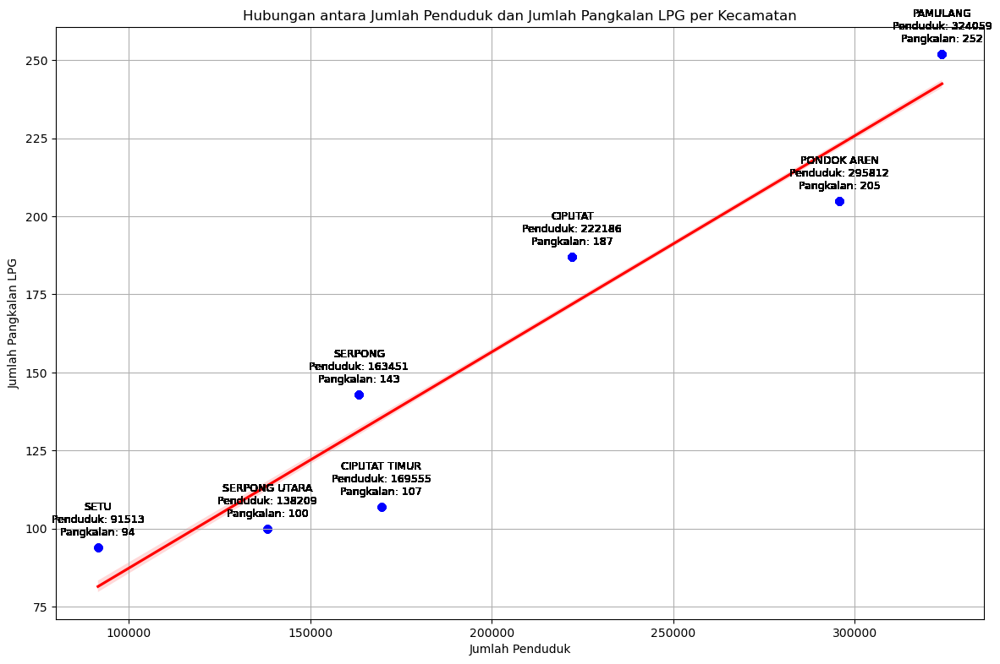

In [54]:
# Import library yang dibutuhkan
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression

# Baca data dengan delimiter yang benar
try:
    df = pd.read_csv('merchants_tangsel_final.csv', 
                     sep=';',  # Gunakan titik koma sebagai pemisah
                     quotechar='"',  # Gunakan tanda kutip untuk mengelompokkan teks
                     encoding='utf-8')  # Specify encoding
    print("Data berhasil dibaca:")
except Exception as e:
    print("Gagal membaca file CSV. Pastikan file ada dan formatnya benar.")
    print("Error:", e)
    exit()

# Data jumlah penduduk per kecamatan (Tangerang Selatan dalam Angka 2024)
kepadatan_penduduk = {  
    'Kecamatan': ['SETU', 'SERPONG', 'PAMULANG', 'CIPUTAT', 'CIPUTAT TIMUR', 'PONDOK AREN', 'SERPONG UTARA'],  
    'Jumlah Penduduk': [91513, 163451, 324059, 222186, 169555, 295812, 138209]  # Data jumlah penduduk tahun 2023  
}
df_kepadatan = pd.DataFrame(kepadatan_penduduk)

# Gabungkan data kepadatan penduduk dengan data pangkalan LPG
try:
    df_merged = df.merge(df_kepadatan, on='Kecamatan', how='left')
    print("\nData gabungan berhasil dibuat:")
except Exception as e:
    print("Gagal menggabungkan data.")
    print("Error:", e)
    exit()

# Hitung jumlah pangkalan per kecamatan
try:
    district_counts = df_merged['Kecamatan'].value_counts().reset_index()
    district_counts.columns = ['Kecamatan', 'Jumlah Pangkalan']
    print("\nJumlah pangkalan per kecamatan:")
    print(district_counts)
except Exception as e:
    print("Gagal menghitung jumlah pangkalan per kecamatan.")
    print("Error:", e)
    exit()

# Gabungkan dengan data kepadatan  
try:  
    df_merged_counts = df_merged.merge(district_counts, on='Kecamatan', how='left')  
    print("\nData gabungan dengan jumlah pangkalan:")  
    print(tabulate(df_merged_counts.head(), headers='keys', tablefmt='pretty'))  
except Exception as e:  
    print("Gagal menggabungkan data kepadatan dengan jumlah pangkalan.")  
    print("Error:", e)  
    exit()  

# Persiapan data untuk regresi linier
X = df_merged_counts[['Jumlah Penduduk']]  # Variabel independen (Jumlah Penduduk)
y = df_merged_counts['Jumlah Pangkalan']   # Variabel dependen (Jumlah Pangkalan LPG)

# Buat model regresi linier
model = LinearRegression()
model.fit(X, y)

# Hitung koefisien (slope) dan intercept
slope = model.coef_[0]
intercept = model.intercept_

# Prediksi nilai y berdasarkan model
y_pred = model.predict(X)

# Tambahkan hasil prediksi ke dataframe
df_merged_counts['Prediksi Jumlah Pangkalan'] = y_pred

# Tampilkan hasil regresi
print("\nHasil Regresi Linier:")
print(f"Slope (Koefisien): {slope:.2f}")
print(f"Intercept: {intercept:.2f}")
print(f"Persamaan Regresi: Jumlah Pangkalan = {slope:.2f} * Jumlah Penduduk + {intercept:.2f}")

# Scatter Plot dengan Regresi Linier dan Label Kecamatan
plt.figure(figsize=(12, 8))
sns.regplot(x='Jumlah Penduduk', y='Jumlah Pangkalan', data=df_merged_counts, scatter_kws={'alpha':0.6, 'color':'blue'}, line_kws={'color':'red'})

# Tambahkan label kecamatan, jumlah pangkalan, dan jumlah penduduk
for i, row in df_merged_counts.iterrows():
    plt.annotate(
        f"{row['Kecamatan']}\nPenduduk: {row['Jumlah Penduduk']}\nPangkalan: {row['Jumlah Pangkalan']}", 
        (row['Jumlah Penduduk'], row['Jumlah Pangkalan']), 
        textcoords="offset points", 
        xytext=(0, 10), 
        ha='center', 
        fontsize=9, 
        color='black'
    )

plt.title('Hubungan antara Jumlah Penduduk dan Jumlah Pangkalan LPG per Kecamatan')
plt.xlabel('Jumlah Penduduk')
plt.ylabel('Jumlah Pangkalan LPG')
plt.grid(True)
plt.tight_layout()

# Simpan scatter plot
plt.savefig('scatter_plot_jumlah_penduduk_pangkalan.png', format='png', dpi=300)
plt.show()

Data berhasil dibaca:

Data gabungan berhasil dibuat:
|    | Provinsi   | Kota                   | Kecamatan   | Kelurahan   | ID Merchant   | Nama Pemilik       | Alamat                           | Koordinat             |   Latitude |   Longitude |   Jumlah Penduduk |
|---:|:-----------|:-----------------------|:------------|:------------|:--------------|:-------------------|:---------------------------------|:----------------------|-----------:|------------:|------------------:|
|  0 | BANTEN     | KOTA TANGERANG SELATAN | CIPUTAT     | CIPAYUNG    | 3,15439E+14   | LPG_SATIA LAILA    | JL. CIMANDIRI NO 09              | -6.338779, 106.759972 |   -6.33878 |     106.76  |            222186 |
|  1 | BANTEN     | KOTA TANGERANG SELATAN | CIPUTAT     | CIPAYUNG    | 3,15439E+14   | LPG_MUHAMAD RIDWAN | JL CIMANDIRI NO 09               | -6.33353, 106.752432  |   -6.33353 |     106.752 |            222186 |
|  2 | BANTEN     | KOTA TANGERANG SELATAN | CIPUTAT     | CIPAYUNG    | 3,15417E+

<Figure size 1200x600 with 0 Axes>

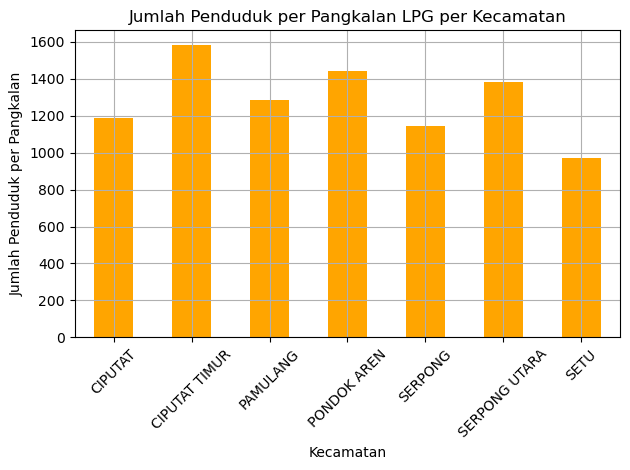

In [177]:
# Import library yang dibutuhkan
import pandas as pd
import matplotlib.pyplot as plt

# Baca data dengan delimiter yang benar
try:
    df = pd.read_csv('merchants_tangsel_final.csv', 
                     sep=';',  # Gunakan titik koma sebagai pemisah
                     quotechar='"',  # Gunakan tanda kutip untuk mengelompokkan teks
                     encoding='utf-8')  # Specify encoding
    print("Data berhasil dibaca:")
except Exception as e:
    print("Gagal membaca file CSV. Pastikan file ada dan formatnya benar.")
    print("Error:", e)
    exit()


# Data jumlah penduduk per kecamatan (Tangerang Selatan dalam Angka 2024)
kepadatan_penduduk = {
    'Kecamatan': ['PAMULANG', 'PONDOK AREN', 'CIPUTAT', 'SERPONG', 'CIPUTAT TIMUR', 'SERPONG UTARA', 'SETU'],
    'Jumlah Penduduk': [324059, 295812, 222186, 163451, 169555, 138209, 91513]  # Data jumlah penduduk
}

df_kepadatan = pd.DataFrame(kepadatan_penduduk)

# Gabungkan data kepadatan penduduk dengan data pangkalan LPG
try:  
    df_merged = df.merge(df_kepadatan, on='Kecamatan', how='left')  
    print("\nData gabungan berhasil dibuat:")  
    print(tabulate(df_merged.head(), headers='keys', tablefmt='pipe'))  
except Exception as e:  
    print("Gagal menggabungkan data.")  
    print("Error:", e)  
    exit()
    
# Hitung jumlah pangkalan per kecamatan  
try:  
    district_counts = df_merged['Kecamatan'].value_counts().reset_index()  
    district_counts.columns = ['Kecamatan', 'Jumlah Pangkalan']  
    print("\nJumlah pangkalan per kecamatan:")  
    print(tabulate(district_counts, headers='keys', tablefmt='pipe'))  
except Exception as e:  
    print("Gagal menghitung jumlah pangkalan per kecamatan.")  
    print("Error:", e)  
    exit()

# Gabungkan dengan data kepadatan
try:
    df_merged_counts = df_merged.merge(district_counts, on='Kecamatan', how='left')
    print("\nData gabungan dengan jumlah pangkalan:")
    print(tabulate(df_merged_counts.head(), headers='keys', tablefmt='pipe'))
except Exception as e:
    print("Gagal menggabungkan data kepadatan dengan jumlah pangkalan.")
    print("Error:", e)
    exit()

# Hitung jumlah penduduk per pangkalan
df_merged_counts['Jumlah Penduduk per Pangkalan'] = (  
    df_merged_counts['Jumlah Penduduk'] / df_merged_counts['Jumlah Pangkalan']  
).astype(int) 
# Tampilkan hasil dalam bentuk tabel  
result_table = df_merged_counts[['Kecamatan', 'Jumlah Penduduk', 'Jumlah Pangkalan', 'Jumlah Penduduk per Pangkalan']].drop_duplicates()  
print("\nJumlah Penduduk per Pangkalan LPG per Kecamatan:")  
print(tabulate(result_table, headers='keys', tablefmt='pretty'))  

# Bar Plot untuk Jumlah Penduduk per Pangkalan
plt.figure(figsize=(12, 6))
result_table.plot(kind='bar', x='Kecamatan', y='Jumlah Penduduk per Pangkalan', color='orange', legend=False)
plt.title('Jumlah Penduduk per Pangkalan LPG per Kecamatan')
plt.xlabel('Kecamatan')
plt.ylabel('Jumlah Penduduk per Pangkalan')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()

# Simpan bar plot
plt.savefig('bar_plot_jumlah_penduduk_per_pangkalan.png', format='png', dpi=300)
plt.show()

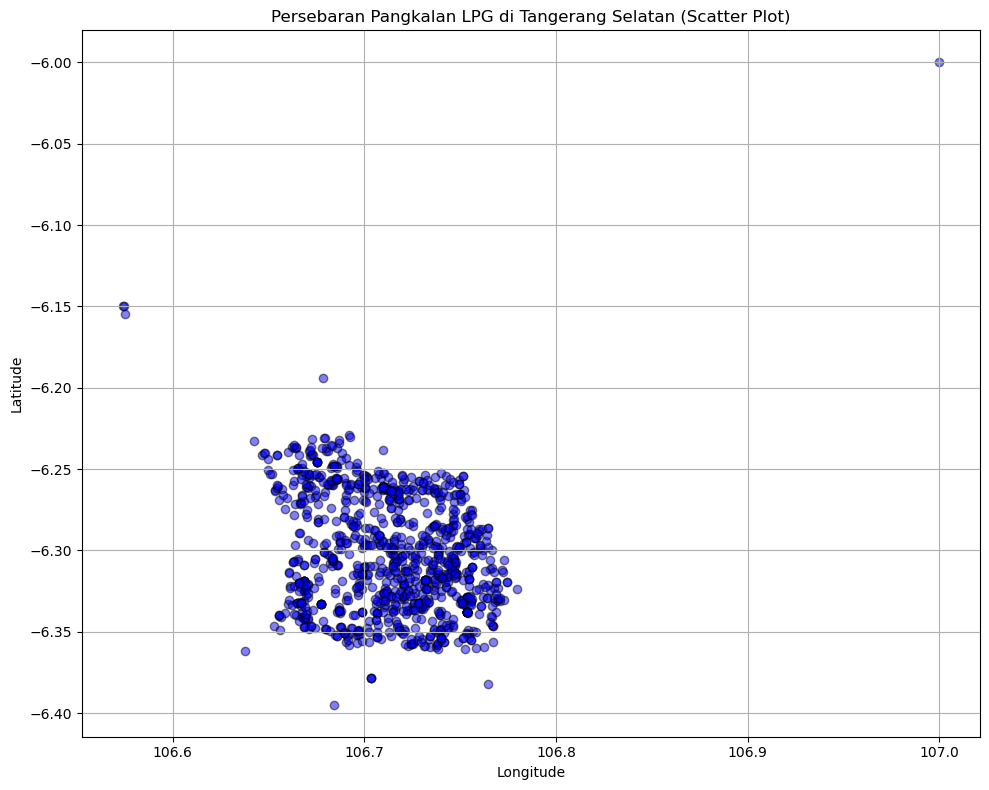

In [181]:
# 2. Visualisasi Scatter Plot (Titik)
plt.figure(figsize=(10, 8))
plt.scatter(df['Longitude'], df['Latitude'], alpha=0.5, c='blue', edgecolor='k')
plt.title('Persebaran Pangkalan LPG di Tangerang Selatan (Scatter Plot)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.tight_layout()
plt.show()

# 3. Visualisasi Peta Lokasi Pangkalan
def create_map(df):
    # Ambil koordinat tengah Tangerang Selatan
    center_lat = df['Latitude'].mean()
    center_lon = df['Longitude'].mean()
    
    # Buat peta
    m = folium.Map(location=[center_lat, center_lon], zoom_start=12)
    
    # Tambahkan marker untuk setiap pangkalan
    for idx, row in df.iterrows():
        folium.Marker(
            [row['Latitude'], row['Longitude']],
            popup=f"Pangkalan: {row['Nama Pemilik']}<br>Alamat: {row['Alamat']}"
        ).add_to(m)
    
    return m

In [396]:
# Import library yang diperlukan
import pandas as pd
import numpy as np
import geopandas as gpd
from shapely.geometry import Point
from scipy.spatial.distance import pdist
import matplotlib.pyplot as plt
import seaborn as sns
import folium

# 1. Load Data Pangkalan
# Misalkan df adalah DataFrame yang berisi data pangkalan dengan kolom: Kecamatan, Kelurahan, Latitude, Longitude
# Contoh data:
data = {
    'Kecamatan': ['Ciputat', 'Pondok Aren', 'Serpong', 'Ciputat', 'Pondok Aren'],
    'Kelurahan': ['Ciputat', 'Pondok Kacang', 'Serpong Utara', 'Ciputat Timur', 'Pondok Karya'],
    'Latitude': [-6.28862, -6.26667, -6.31667, -6.28862, -6.26667],
    'Longitude': [106.71789, 106.71667, 106.68333, 106.71789, 106.71667]
}
df = pd.DataFrame(data)

# 2. Load Data Administrasi Tangerang Selatan (GeoJSON)
# Misalkan data GeoJSON disimpan dalam variabel adm_tangsel_geojson
adm_tangsel_geojson = {
    "type": "FeatureCollection",
    "name": "adm_tangsel",
    "crs": { "type": "name", "properties": { "name": "urn:ogc:def:crs:OGC:1.3:CRS84" } },
    "features": [
        { "type": "Feature", "properties": { "OBJECTID": 1, "GID_4": "IDN.4.7.2.1_1", "GID_0": "IDN", "COUNTRY": "Indonesia", "GID_1": "IDN.4_1", "NAME_1": "Banten", "GID_2": "IDN.4.7_1", "NAME_2": "Tangerang Selatan", "GID_3": "IDN.4.7.2_1", "NAME_3": "Ciputat", "NAME_4": "Cipayung", "VARNAME_4": "NA", "TYPE_4": "Kelurahan", "ENGTYPE_4": "Urban Community", "CC_4": "3674040007", "Shape_Leng": 0.08982253027000001, "Shape_Area": 0.00023022399 }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 106.71789, -6.28862 ], [ 106.71667, -6.26667 ], [ 106.68333, -6.31667 ], [ 106.71789, -6.28862 ] ] ] ] } }
    ]
}

# Konversi GeoJSON ke GeoDataFrame
adm_tangsel = gpd.GeoDataFrame.from_features(adm_tangsel_geojson['features'], crs="EPSG:4326")

# 3. Filter Titik Pangkalan yang Berada di Luar Administrasi Tangerang Selatan
# Konversi DataFrame ke GeoDataFrame
geometry = [Point(xy) for xy in zip(df['Longitude'], df['Latitude'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")

# Filter titik pangkalan yang berada di dalam batas administrasi Tangerang Selatan
# Gunakan parameter `predicate` sebagai pengganti `op`
gdf = gpd.sjoin(gdf, adm_tangsel, how="inner", predicate="within")

# Kembalikan ke DataFrame biasa jika diperlukan
df_filtered = gdf.drop(columns=['geometry'])

# 4. Analisis per Kelurahan
kelurahan_counts = df_filtered.groupby(['Kecamatan', 'Kelurahan']).size().reset_index(name='Jumlah_Pangkalan')
print("Distribusi Pangkalan per Kelurahan:")
print(kelurahan_counts.sort_values('Jumlah_Pangkalan', ascending=False))

# 5. Analisis Jarak
coordinates = df_filtered[['Latitude', 'Longitude']].values
distances = pdist(coordinates)
distances_km = distances * 111  # Konversi ke kilometer

print("\nAnalisis Jarak antar Pangkalan:")
print(f"Rata-rata jarak: {np.mean(distances_km):.2f} km")
print(f"Jarak minimum: {np.min(distances_km[distances_km > 0]):.2f} km")
print(f"Jarak maksimum: {np.max(distances_km):.2f} km")

# 6. Analisis Kepadatan
area_tangsel = 147.19  # Luas Tangerang Selatan dalam km²
density = len(df_filtered) / area_tangsel

print(f"\nAnalisis Kepadatan:")
print(f"Jumlah pangkalan: {len(df_filtered)}")
print(f"Kepadatan pangkalan per km²: {density:.2f}")

# 7. Visualisasi Distribusi Pangkalan per Kelurahan
plt.figure(figsize=(15, 6))
sns.boxplot(data=kelurahan_counts, x='Kecamatan', y='Jumlah_Pangkalan')
plt.title('Distribusi Jumlah Pangkalan per Kecamatan')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 8. Visualisasi Spasial (Opsional)
# Buat peta dasar
m = folium.Map(location=[-6.28862, 106.71789], zoom_start=12)

# Tambahkan titik pangkalan ke peta
for idx, row in gdf.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue'
    ).add_to(m)

# Tambahkan batas administrasi Tangerang Selatan ke peta
folium.GeoJson(adm_tangsel_geojson, name="Batas Administrasi").add_to(m)

# Tampilkan peta
m

Distribusi Pangkalan per Kelurahan:
Empty DataFrame
Columns: [Kecamatan, Kelurahan, Jumlah_Pangkalan]
Index: []

Analisis Jarak antar Pangkalan:
Rata-rata jarak: nan km


C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


ValueError: zero-size array to reduction operation minimum which has no identity

In [343]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point
import folium
from folium.plugins import GroupedLayerControl
import numpy as np

def create_buffer_analysis(df, geojson_data, buffer_distances=[300, 500, 1000]):
    # Convert DataFrame to GeoDataFrame with CRS
    geometry = [Point(xy) for xy in zip(df['Longitude'], df['Latitude'])]
    gdf_points = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")
    
    # Convert to projected CRS for accurate buffer distances (in meters)
    gdf_points = gdf_points.to_crs("EPSG:32748")  # UTM 48S for Tangerang area
    
    # Create buffers
    buffers = {}
    for dist in buffer_distances:
        buffer_geometries = gdf_points.buffer(dist)
        buffers[dist] = buffer_geometries.union_all()
    
    # Load and process administrative boundaries
    gdf_admin = gpd.GeoDataFrame.from_features(geojson_data)
    # Set CRS explicitly for admin boundaries
    gdf_admin.set_crs("EPSG:4326", inplace=True)
    gdf_admin = gdf_admin.to_crs("EPSG:32748")
    
    # Calculate uncovered areas for each buffer distance
    uncovered_analysis = {}
    for dist in buffer_distances:
        # Create difference between admin area and buffer
        uncovered = gdf_admin.copy()
        uncovered['geometry'] = gdf_admin.geometry.difference(buffers[dist])
        uncovered['uncovered_area'] = uncovered.geometry.area / 1000000  # Convert to km²
        uncovered['total_area'] = gdf_admin.geometry.area / 1000000
        uncovered['percent_uncovered'] = (uncovered['uncovered_area'] / uncovered['total_area'] * 100).round(2)
        
        # Store results
        uncovered_analysis[dist] = uncovered
    
    # Create visualization
    # Convert back to WGS 84 for mapping
    gdf_points = gdf_points.to_crs("EPSG:4326")
    gdf_admin = gdf_admin.to_crs("EPSG:4326")
    
    # Create base map
    center_lat = gdf_points.geometry.y.mean()
    center_lon = gdf_points.geometry.x.mean()
    m = folium.Map(location=[center_lat, center_lon], zoom_start=12, tiles='CartoDB Positron')

    # Add administrative boundaries for Kelurahan
    folium.GeoJson(
        gdf_admin.__geo_interface__,
        name='Batas Kelurahan',
        style_function=lambda x: {
            'fillColor': '#ffffff',
            'color': '#666666',
            'weight': 1,
            'fillOpacity': 0.1
        }
    ).add_to(m)

    # Dissolve Kelurahan to get Kecamatan boundaries
    gdf_kecamatan = gdf_admin.dissolve(by='NAME_3')
    
    # Add administrative boundaries for Kecamatan
    folium.GeoJson(
        gdf_kecamatan.__geo_interface__,
        name='Batas Kecamatan',
        style_function=lambda x: {
            'fillColor': '#ffffff',
            'color': '#000000',
            'weight': 3,
            'fillOpacity': 0
        }
    ).add_to(m)

    # Create a feature group for kelurahan labels
    kec_labels = folium.FeatureGroup(name='Label Kecamatan', show=True)

    # Add labels for kecamatan (always visible)
    for idx, row in gdf_kecamatan.iterrows():
        centroid = row.geometry.centroid
        folium.Marker(
            location=[centroid.y, centroid.x],
            icon=folium.DivIcon(
                icon_size=(150, 36),
                icon_anchor=(75, 18),
                html=f'<div style="font-size: 12pt; font-weight: bold; color: black; font-family: Arial, sans-serif;">{idx}</div>'
            )
        ).add_to(kec_labels)

        kec_labels.add_to(m)

    # Create a feature group for kelurahan labels
    kelurahan_labels = folium.FeatureGroup(name='Label Kelurahan', show=False)
    
    # Add labels for kelurahan
    for idx, row in gdf_admin.iterrows():
        centroid = row.geometry.centroid
        folium.Marker(
            location=[centroid.y, centroid.x],
            icon=folium.DivIcon(
                icon_size=(150, 36),
                icon_anchor=(75, 18),
                html=f'<div style="font-size: 12pt; font-weight: normal; color: black; font-family: Arial, sans-serif;">{row.NAME_4}</div>'
            )
        ).add_to(kelurahan_labels)

    kelurahan_labels.add_to(m)

# Tambahkan buffer dengan warna berbeda dan kontrol layer  
    colors = ['#ff0000', '#00ff00', '#0000ff']  
    for i, (dist, buffer_geom) in enumerate(buffers.items()):  
        buffer_gdf = gpd.GeoDataFrame(geometry=[buffer_geom], crs="EPSG:32748").to_crs("EPSG:4326")  
        
        # Atur 'overlay' menjadi False untuk buffer 500m dan 1000m  
        if dist in [500, 1000]:  
            show = False  
        else:  
            show = True  

        folium.GeoJson(  
            buffer_gdf.__geo_interface__,  
            name=f'Buffer {dist/1000}km',  
            style_function=lambda x, color=colors[i]: {  
                'fillColor': color,  
                'color': color,  
                'weight': 1,  
                'fillOpacity': 0.2  
            },  
            show=show  # Atur agar layer tidak aktif secara default  
        ).add_to(m) 
    
    # Add LPG distribution points
    fg = folium.FeatureGroup(name='Pangkalan LPG')
    for idx, row in df.iterrows():
        folium.CircleMarker(
            location=[row['Latitude'], row['Longitude']],
            radius=5,
            color='blue',
            fill=True,
            fill_color='blue',
            fill_opacity=0.7,
            popup=folium.Popup(
                f"""
                <div style='width: 200px'>
                    <b>Pangkalan:</b> {row['Nama Pemilik']}<br>
                    <b>Alamat:</b> {row['Alamat']}<br>
                    <b>Kecamatan:</b> {row['Kecamatan']}
                </div>
                """,
                max_width=300
            )
        ).add_to(fg)
    
    fg.add_to(m)
    
    # Add layer control
    folium.LayerControl().add_to(m)
    
    return m, uncovered_analysis

# Run analysis
map_result, uncovered_results = create_buffer_analysis(df, geojson_data)

# Display results
print("\nAnalisis Area Tidak Tercover:")
for dist, uncovered_df in uncovered_results.items():
    print(f"\nBuffer {dist/1000} km:")
    print("\nKelurahan dengan area tidak tercover terbesar:")
    # Tampilkan hasil per kelurahan
    summary = uncovered_df.sort_values('percent_uncovered', ascending=False)[
        ['NAME_3', 'NAME_4', 'uncovered_area', 'percent_uncovered']
    ].head()
    print(summary.to_string())
    
    # Tampilkan ringkasan per kecamatan
    print(f"\nRingkasan per Kecamatan untuk buffer {dist/1000} km:")
    kecamatan_summary = uncovered_df.groupby('NAME_3').agg({
        'uncovered_area': 'sum',
        'total_area': 'sum'
    })
    kecamatan_summary['percent_uncovered'] = (
        kecamatan_summary['uncovered_area'] / kecamatan_summary['total_area'] * 100
    ).round(2)
    print(kecamatan_summary.sort_values('percent_uncovered', ascending=False).to_string())

# Display map
display(map_result)


Analisis Area Tidak Tercover:

Buffer 0.3 km:

Kelurahan dengan area tidak tercover terbesar:
           NAME_3           NAME_4  uncovered_area  percent_uncovered
43  Serpong Utara        Paku Alam        2.160442              71.77
52           Setu           Muncul        2.427702              70.89
37        Serpong   Lengkong Wetan        2.016583              70.13
42  Serpong Utara   Lengkong Karya        2.155661              69.08
35        Serpong  Lengkong Gudang        2.134653              66.37

Ringkasan per Kecamatan untuk buffer 0.3 km:
               uncovered_area  total_area  percent_uncovered
NAME_3                                                      
Serpong             13.185245   28.567774              46.15
Setu                 7.748124   16.817184              46.07
Serpong Utara        9.971313   22.104188              45.11
Ciputat Timur        5.458470   18.126348              30.11
Pondok Aren          7.613343   29.958499              25.41
Pamulang    

In [297]:
from sklearn.neighbors import NearestNeighbors
import numpy as np

# Ambil koordinat
coords = df[['Latitude', 'Longitude']].values

# Hitung nearest neighbor
nbrs = NearestNeighbors(n_neighbors=2).fit(coords)  # Default n_neighbors=2
distances, indices = nbrs.kneighbors(coords)

# Ambil jarak ke nearest neighbor (kolom 1 karena kolom 0 adalah jarak ke diri sendiri)
nearest_distances = distances[:, 1]

# Konversi jarak dari derajat ke kilometer dan meter
nearest_distances_km = nearest_distances * 111  # 1 derajat ≈ 111 km
nearest_distances_m = nearest_distances_km * 1000  # 1 km = 1000 m

# Hitung rata-rata jarak nearest neighbor dalam kilometer dan meter
mean_nearest_distance_km = np.mean(nearest_distances_km)
mean_nearest_distance_m = np.mean(nearest_distances_m)

# Cetak hasil
print("=== Hasil Analisis Nearest Neighbor (NN) ===")
print(f"Rata-rata jarak ke nearest neighbor: {mean_nearest_distance_km:.4f} km")
print(f"Rata-rata jarak ke nearest neighbor: {mean_nearest_distance_m:.4f} m")

# Penjelasan tentang Nearest Neighbor (NN)
print("\n=== Penjelasan Nearest Neighbor (NN) ===")
print("Nearest Neighbor (NN) adalah jarak terdekat antara satu titik dengan titik terdekatnya dalam dataset.")
print("NN digunakan untuk menganalisis pola sebaran titik-titik dalam ruang:")
print("- Jika jarak NN besar, titik-titik cenderung tersebar (dispersed).")
print("- Jika jarak NN kecil, titik-titik cenderung berkumpul (clustered).")
print("- Jika jarak NN sedang, titik-titik cenderung tersebar secara acak (random).")

# Interpretasi pola sebaran
print("\n=== Interpretasi Pola Sebaran ===")
if mean_nearest_distance_km > 1.0:  # Ambang batas bisa disesuaikan
    print("Interpretasi: Titik-titik cenderung tersebar (dispersed).")
elif mean_nearest_distance_km < 0.5:  # Ambang batas bisa disesuaikan
    print("Interpretasi: Titik-titik cenderung berkumpul (clustered).")
else:
    print("Interpretasi: Titik-titik cenderung tersebar secara acak (random).")

=== Hasil Analisis Nearest Neighbor (NN) ===
Rata-rata jarak ke nearest neighbor: 0.1867 km
Rata-rata jarak ke nearest neighbor: 186.7378 m

=== Penjelasan Nearest Neighbor (NN) ===
Nearest Neighbor (NN) adalah jarak terdekat antara satu titik dengan titik terdekatnya dalam dataset.
NN digunakan untuk menganalisis pola sebaran titik-titik dalam ruang:
- Jika jarak NN besar, titik-titik cenderung tersebar (dispersed).
- Jika jarak NN kecil, titik-titik cenderung berkumpul (clustered).
- Jika jarak NN sedang, titik-titik cenderung tersebar secara acak (random).

=== Interpretasi Pola Sebaran ===
Interpretasi: Titik-titik cenderung berkumpul (clustered).


In [392]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point
import folium
from folium.plugins import GroupedLayerControl
import numpy as np
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.common.by import By
import time
import os

def create_buffer_analysis(df, geojson_data, buffer_distances=[300, 500, 1000]):
    # Convert DataFrame to GeoDataFrame with CRS
    geometry = [Point(xy) for xy in zip(df['Longitude'], df['Latitude'])]
    gdf_points = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")
    
    # Convert to projected CRS for accurate buffer distances (in meters)
    gdf_points = gdf_points.to_crs("EPSG:32748")  # UTM 48S for Tangerang area
    
    # Create buffers
    buffers = {}
    for dist in buffer_distances:
        buffer_geometries = gdf_points.buffer(dist)
        buffers[dist] = buffer_geometries.union_all()
    
    # Load and process administrative boundaries
    gdf_admin = gpd.GeoDataFrame.from_features(geojson_data)
    # Set CRS explicitly for admin boundaries
    gdf_admin.set_crs("EPSG:4326", inplace=True)
    gdf_admin = gdf_admin.to_crs("EPSG:32748")
    
    # Calculate uncovered areas for each buffer distance
    uncovered_analysis = {}
    for dist in buffer_distances:
        # Create difference between admin area and buffer
        uncovered = gdf_admin.copy()
        uncovered['geometry'] = gdf_admin.geometry.difference(buffers[dist])
        uncovered['uncovered_area'] = uncovered.geometry.area / 1000000  # Convert to km²
        uncovered['total_area'] = gdf_admin.geometry.area / 1000000
        uncovered['percent_uncovered'] = (uncovered['uncovered_area'] / uncovered['total_area'] * 100).round(2)
        
        # Store results
        uncovered_analysis[dist] = uncovered
    
    # Create visualization
    # Convert back to WGS 84 for mapping
    gdf_points = gdf_points.to_crs("EPSG:4326")
    gdf_admin = gdf_admin.to_crs("EPSG:4326")
    
    # Create base map
    center_lat = gdf_points.geometry.y.mean()
    center_lon = gdf_points.geometry.x.mean()
    m = folium.Map(location=[center_lat, center_lon], zoom_start=12, tiles='CartoDB Positron')

    # Add administrative boundaries for Kelurahan
    folium.GeoJson(
        gdf_admin.__geo_interface__,
        name='Batas Kelurahan',
        style_function=lambda x: {
            'fillColor': '#ffffff',
            'color': '#666666',
            'weight': 1,
            'fillOpacity': 0.1
        }
    ).add_to(m)

    # Dissolve Kelurahan to get Kecamatan boundaries
    gdf_kecamatan = gdf_admin.dissolve(by='NAME_3')
    
    # Add administrative boundaries for Kecamatan
    folium.GeoJson(
        gdf_kecamatan.__geo_interface__,
        name='Batas Kecamatan',
        style_function=lambda x: {
            'fillColor': '#ffffff',
            'color': '#000000',
            'weight': 3,
            'fillOpacity': 0
        }
    ).add_to(m)

    # Create a feature group for kelurahan labels
    kec_labels = folium.FeatureGroup(name='Label Kecamatan', show=True)

    # Add labels for kecamatan (always visible)
    for idx, row in gdf_kecamatan.iterrows():
        centroid = row.geometry.centroid
        folium.Marker(
            location=[centroid.y, centroid.x],
            icon=folium.DivIcon(
                icon_size=(150, 36),
                icon_anchor=(75, 18),
                html=f'<div style="font-size: 12pt; font-weight: bold; color: black; font-family: Arial, sans-serif;">{idx}</div>'
            )
        ).add_to(kec_labels)

        kec_labels.add_to(m)

    # Create a feature group for kelurahan labels
    kelurahan_labels = folium.FeatureGroup(name='Label Kelurahan', show=False)
    
    # Add labels for kelurahan
    for idx, row in gdf_admin.iterrows():
        centroid = row.geometry.centroid
        folium.Marker(
            location=[centroid.y, centroid.x],
            icon=folium.DivIcon(
                icon_size=(150, 36),
                icon_anchor=(75, 18),
                html=f'<div style="font-size: 12pt; font-weight: bold; color: #222222; font-family: Arial, sans-serif;">{row.NAME_4}</div>',            
            )
        ).add_to(kelurahan_labels)

    kelurahan_labels.add_to(m)

    # Tambahkan buffer dengan warna berbeda dan kontrol layer  
    colors = ['#ff0000', '#00ff00', '#0000ff']  
    for i, (dist, buffer_geom) in enumerate(buffers.items()):  
        buffer_gdf = gpd.GeoDataFrame(geometry=[buffer_geom], crs="EPSG:32748").to_crs("EPSG:4326")  
        
        # Atur 'overlay' menjadi False untuk buffer 500m dan 1000m  
        if dist in [500, 1000]:  
            show = False  
        else:  
            show = True  

        folium.GeoJson(  
            buffer_gdf.__geo_interface__,  
            name=f'Buffer {dist/1000}km',  
            style_function=lambda x, color=colors[i]: {  
                'fillColor': color,  
                'color': color,  
                'weight': 1,  
                'fillOpacity': 0.2  
            },  
            show=show  # Atur agar layer tidak aktif secara default  
        ).add_to(m) 
    
    # Add LPG distribution points
    fg = folium.FeatureGroup(name='Pangkalan LPG')
    for idx, row in df.iterrows():
        folium.CircleMarker(
            location=[row['Latitude'], row['Longitude']],
            radius=5,
            color='blue',
            fill=True,
            fill_color='blue',
            fill_opacity=0.7,
            popup=folium.Popup(
                f"""
                <div style='width: 200px'>
                    <b>Pangkalan:</b> {row['Nama Pemilik']}<br>
                    <b>Alamat:</b> {row['Alamat']}<br>
                    <b>Kecamatan:</b> {row['Kecamatan']}
                </div>
                """,
                max_width=300
            )
        ).add_to(fg)
    
    fg.add_to(m)
    
    # Add layer control
    folium.LayerControl().add_to(m)
    
    return m, uncovered_analysis

# Run analysis
map_result, uncovered_results = create_buffer_analysis(df, geojson_data)

# Simpan hasil analisis ke CSV
for dist, uncovered_df in uncovered_results.items():
    filename = f'uncovered_analysis_{dist}m.csv'
    uncovered_df.to_csv(filename, index=False)
    print(f"Hasil analisis untuk buffer {dist}m disimpan sebagai {filename}")

# Simpan peta sebagai HTML
html_file = 'map_result.html'
map_result.save(html_file)
print(f"Peta disimpan sebagai {html_file}")

# Display results
print("\nAnalisis Area Tidak Tercover:")
for dist, uncovered_df in uncovered_results.items():
    print(f"\nBuffer {dist/1000} km:")
    print("\nKelurahan dengan area tidak tercover terbesar:")
    # Tampilkan hasil per kelurahan
    summary = uncovered_df.sort_values('percent_uncovered', ascending=False)[
        ['NAME_3', 'NAME_4', 'uncovered_area', 'percent_uncovered']
    ].head()
    print(summary.to_string())
    
    # Tampilkan ringkasan per kecamatan
    print(f"\nRingkasan per Kecamatan untuk buffer {dist/1000} km:")
    kecamatan_summary = uncovered_df.groupby('NAME_3').agg({
        'uncovered_area': 'sum',
        'total_area': 'sum'
    })
    kecamatan_summary['percent_uncovered'] = (
        kecamatan_summary['uncovered_area'] / kecamatan_summary['total_area'] * 100
    ).round(2)
    print(kecamatan_summary.sort_values('percent_uncovered', ascending=False).to_string())

# Display map
display(map_result)

Hasil analisis untuk buffer 300m disimpan sebagai uncovered_analysis_300m.csv
Hasil analisis untuk buffer 500m disimpan sebagai uncovered_analysis_500m.csv
Hasil analisis untuk buffer 1000m disimpan sebagai uncovered_analysis_1000m.csv
Peta disimpan sebagai map_result.html

Analisis Area Tidak Tercover:

Buffer 0.3 km:

Kelurahan dengan area tidak tercover terbesar:
           NAME_3           NAME_4  uncovered_area  percent_uncovered
43  Serpong Utara        Paku Alam        2.160442              71.77
52           Setu           Muncul        2.427702              70.89
37        Serpong   Lengkong Wetan        2.016583              70.13
42  Serpong Utara   Lengkong Karya        2.155661              69.08
35        Serpong  Lengkong Gudang        2.134653              66.37

Ringkasan per Kecamatan untuk buffer 0.3 km:
               uncovered_area  total_area  percent_uncovered
NAME_3                                                      
Serpong             13.185245   28.567774  

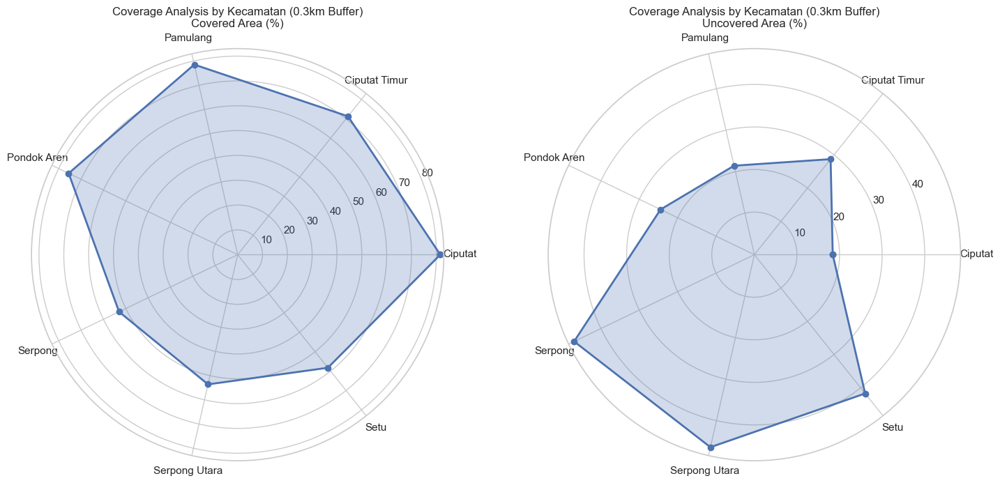

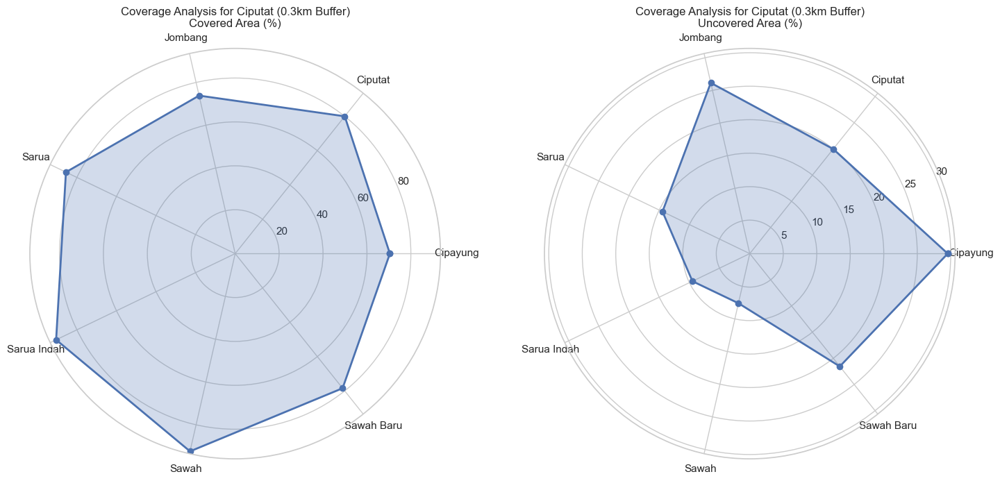

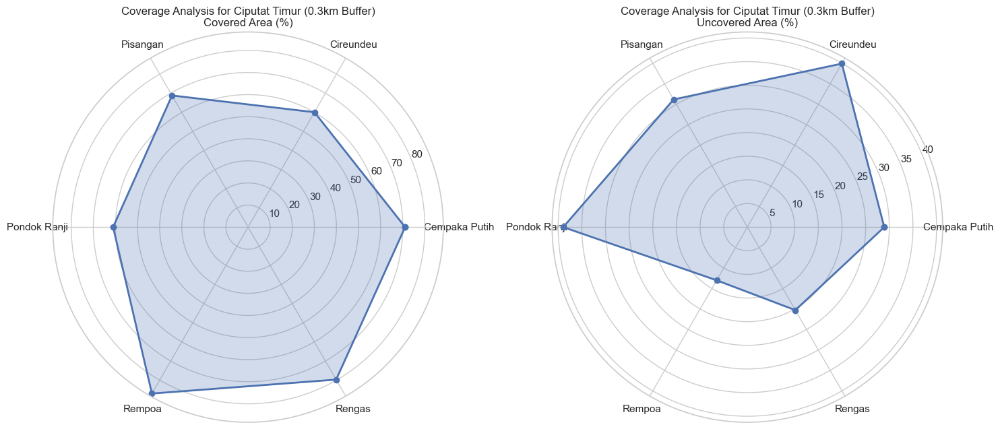

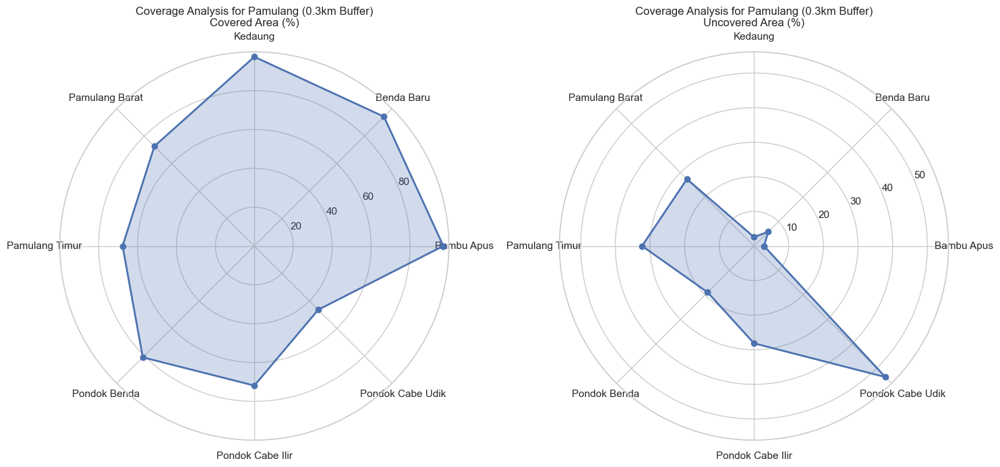

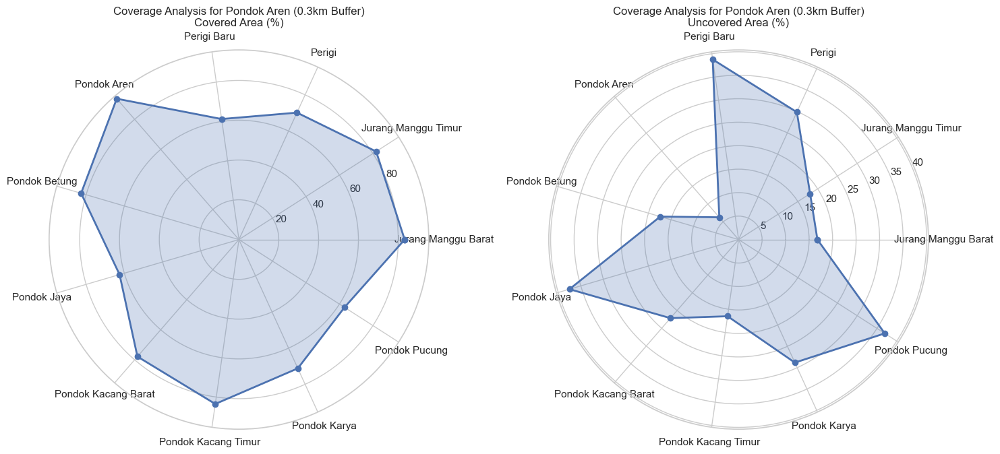

...

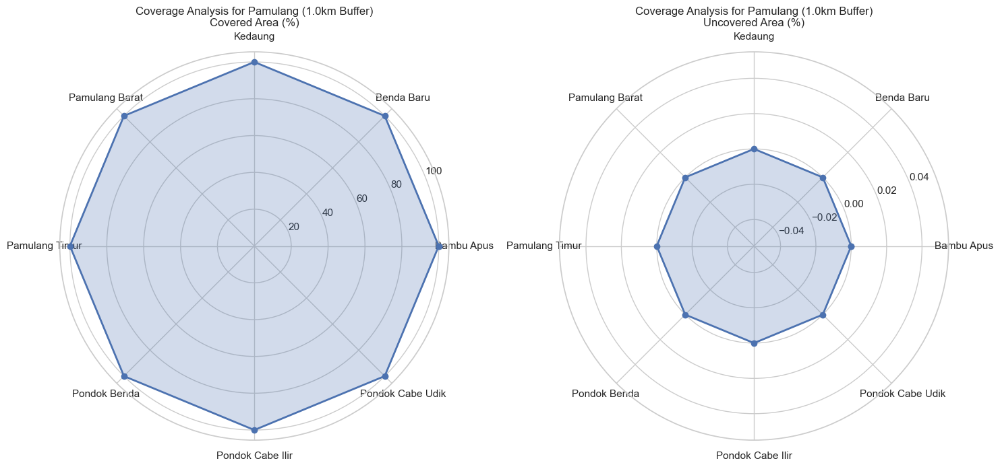

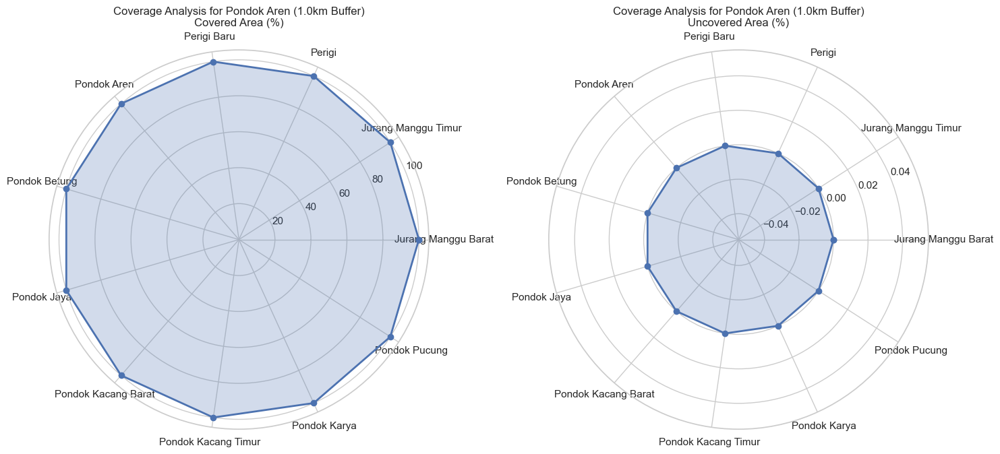

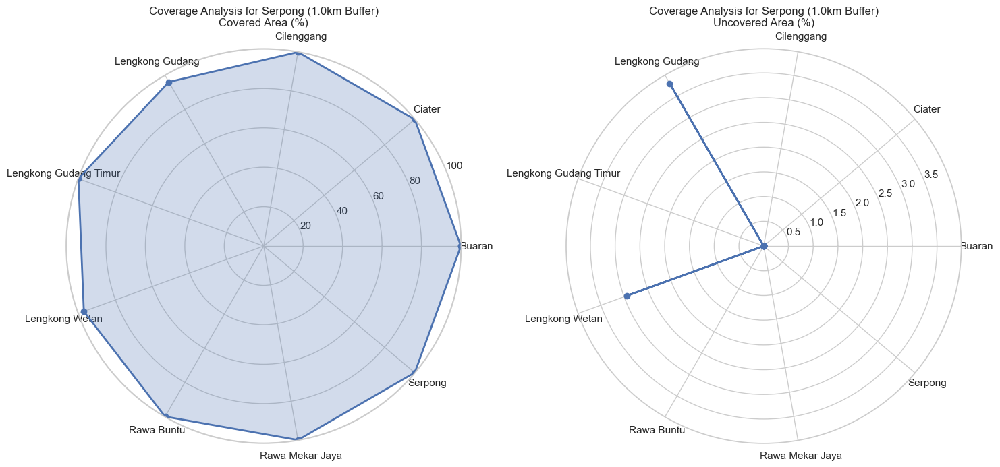

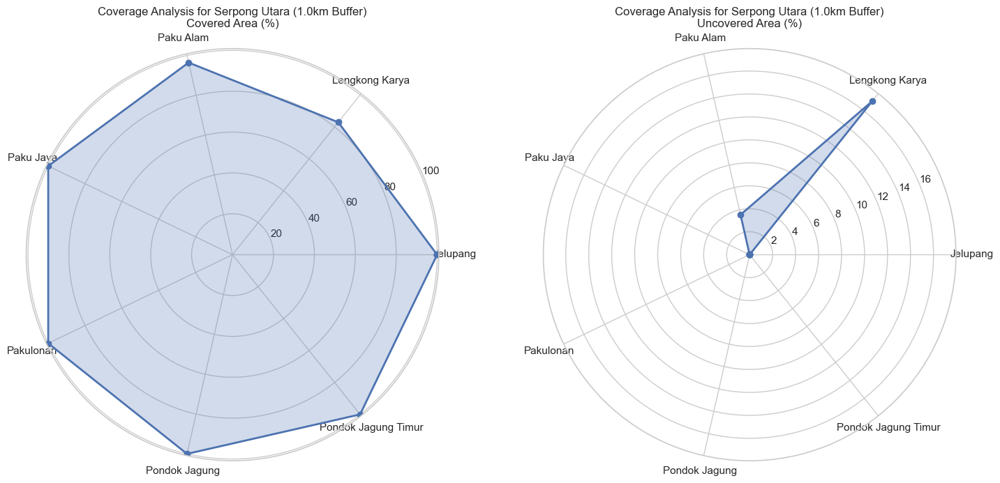

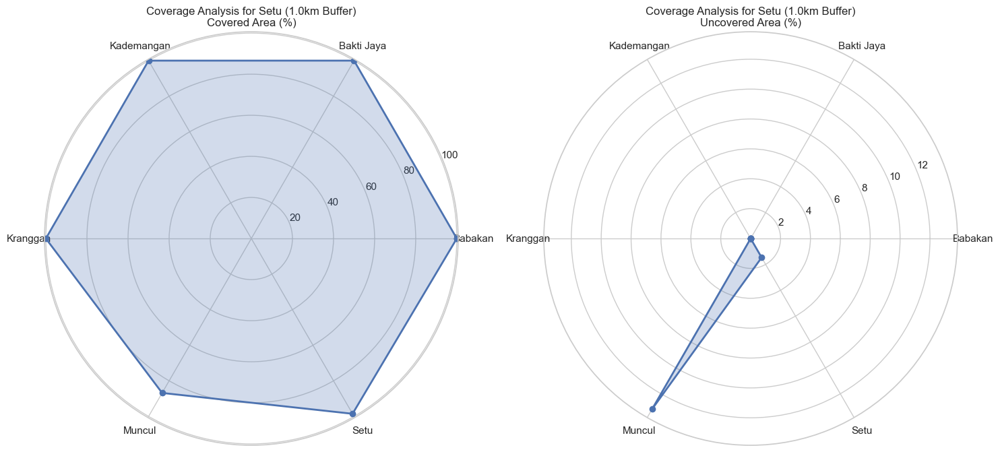

In [418]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

def create_radar_chart(ax, angles, values, category_names, title):
    """
    Create a radar chart with the given values and categories.
    
    Parameters:
    -----------
    ax : matplotlib.axes.Axes
        The axes to plot on
    angles : array
        The angles for each category
    values : array
        The values for each category
    category_names : list
        Names of each category
    title : str
        Title of the chart
    """
    # Complete the circle by appending the first value to the end
    values = np.concatenate((values, [values[0]]))
    
    # Plot data
    ax.plot(angles, values, 'o-', linewidth=2)
    ax.fill(angles, values, alpha=0.25)
    
    # Set category labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(category_names)
    
    # Add title
    ax.set_title(title)
    
    # Add grid
    ax.grid(True)

def plot_coverage_analysis(uncovered_results, buffer_distance):
    """
    Create radar charts for both Kecamatan and Kelurahan level analysis
    
    Parameters:
    -----------
    uncovered_results : dict
        Dictionary containing analysis results
    buffer_distance : int
        Buffer distance in meters
    """
    # Get the data for the specified buffer distance
    df = uncovered_results[buffer_distance].copy()
    
    # Calculate covered percentage
    df['percent_covered'] = 100 - df['percent_uncovered']
    
    # Kecamatan Level Analysis
    kecamatan_summary = df.groupby('NAME_3').agg({
        'percent_covered': 'mean',
        'percent_uncovered': 'mean'
    }).round(2)
    
    # Create figure for Kecamatan
    fig_kec, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7), subplot_kw=dict(projection='polar'))
    
    # Prepare data for Kecamatan
    kec_names = kecamatan_summary.index.tolist()
    n_kec = len(kec_names)
    angles_kec = np.linspace(0, 2*np.pi, n_kec, endpoint=False)
    angles_kec = np.concatenate((angles_kec, [angles_kec[0]]))  # Complete the circle
    
    # Create radar charts for Kecamatan
    create_radar_chart(
        ax1, 
        angles_kec,
        kecamatan_summary['percent_covered'].values,
        kec_names,
        f'Coverage Analysis by Kecamatan ({buffer_distance/1000}km Buffer)\nCovered Area (%)'
    )
    
    create_radar_chart(
        ax2,
        angles_kec,
        kecamatan_summary['percent_uncovered'].values,
        kec_names,
        f'Coverage Analysis by Kecamatan ({buffer_distance/1000}km Buffer)\nUncovered Area (%)'
    )
    
    plt.tight_layout()
    plt.show()
    
    # Kelurahan Level Analysis
    # Create separate plots for each Kecamatan to avoid overcrowding
    for kecamatan in kec_names:
        kelurahan_data = df[df['NAME_3'] == kecamatan]
        kel_names = kelurahan_data['NAME_4'].tolist()
        n_kel = len(kel_names)
        
        # Create figure for Kelurahan
        fig_kel, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7), subplot_kw=dict(projection='polar'))
        
        angles_kel = np.linspace(0, 2*np.pi, n_kel, endpoint=False)
        angles_kel = np.concatenate((angles_kel, [angles_kel[0]]))  # Complete the circle
        
        # Create radar charts for Kelurahan
        create_radar_chart(
            ax1,
            angles_kel,
            100 - kelurahan_data['percent_uncovered'].values,
            kel_names,
            f'Coverage Analysis for {kecamatan} ({buffer_distance/1000}km Buffer)\nCovered Area (%)'
        )
        
        create_radar_chart(
            ax2,
            angles_kel,
            kelurahan_data['percent_uncovered'].values,
            kel_names,
            f'Coverage Analysis for {kecamatan} ({buffer_distance/1000}km Buffer)\nUncovered Area (%)'
        )
        
        plt.tight_layout()
        plt.show()

# Plot analysis for each buffer distance
for buffer_distance in [300, 500, 1000]:
    plot_coverage_analysis(uncovered_results, buffer_distance)


Memulai analisis untuk buffer 300 meter
✓ Direktori dibuat: analisis_buffer\buffer_300m

Menganalisis data tingkat Kecamatan...
✓ File CSV Kecamatan tersimpan: analisis_buffer\buffer_300m\analisis_kecamatan_300m.csv

Hasil Analisis Kecamatan:
--------------------------------------------------------------------------------
Kecamatan | Area Tercakup (%) | Area Tidak Tercakup (%) | Total Area (km²)
--------------------------------------------------------------------------------
Ciputat         |            81.6 |                 18.4 |          21.09
Ciputat Timur   |            71.3 |                 28.7 |          18.13
Pamulang        |            78.6 |                 21.4 |          28.00
Pondok Aren     |            75.5 |                 24.5 |          29.96
Serpong         |            53.0 |                 47.0 |          28.57
Serpong Utara   |            53.6 |                 46.4 |          22.10
Setu            |            58.3 |                 41.7 |          16.82
-

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path

def create_and_save_radar_charts(uncovered_results, buffer_distance, output_dir):
    """
    Membuat radar chart dan menyimpan hasilnya dalam format PNG dan CSV
    """
    print(f"\n{'='*50}")
    print(f"Memulai analisis untuk buffer {buffer_distance} meter")
    print(f"{'='*50}")
    
    # Membuat direktori jika belum ada
    buffer_dir = Path(output_dir) / f'buffer_{buffer_distance}m'
    buffer_dir.mkdir(parents=True, exist_ok=True)
    print(f"✓ Direktori dibuat: {buffer_dir}")
    
    # Menyiapkan data
    df = uncovered_results[buffer_distance].copy()
    df['persen_tercakup'] = 100 - df['percent_uncovered']
    
    # Analisis Tingkat Kecamatan
    print("\nMenganalisis data tingkat Kecamatan...")
    kecamatan_summary = df.groupby('NAME_3').agg({
        'persen_tercakup': 'mean',
        'percent_uncovered': 'mean',
        'uncovered_area': 'sum',
        'total_area': 'sum'
    }).round(2)
    
    # Menyimpan hasil analisis kecamatan ke CSV
    csv_path = buffer_dir / f'analisis_kecamatan_{buffer_distance}m.csv'
    kecamatan_summary.to_csv(csv_path)
    print(f"✓ File CSV Kecamatan tersimpan: {csv_path}")
    
    # Menampilkan hasil analisis kecamatan
    print("\nHasil Analisis Kecamatan:")
    print("-" * 80)
    print("Kecamatan | Area Tercakup (%) | Area Tidak Tercakup (%) | Total Area (km²)")
    print("-" * 80)
    for idx, row in kecamatan_summary.iterrows():
        print(f"{idx:<15} | {row['persen_tercakup']:>15.1f} | {row['percent_uncovered']:>20.1f} | {row['total_area']:>14.2f}")
    print("-" * 80)
    
    # Membuat figure untuk Kecamatan
    print("\nMembuat visualisasi radar chart Kecamatan...")
    plt.figure(figsize=(12, 8))
    ax = plt.subplot(111, projection='polar')
    
    # Menyiapkan data untuk Kecamatan
    kec_names = kecamatan_summary.index.tolist()
    n_kec = len(kec_names)
    angles = np.linspace(0, 2*np.pi, n_kec, endpoint=False)
    
    # Plot data
    values_tercakup = np.concatenate((kecamatan_summary['persen_tercakup'].values, 
                                    [kecamatan_summary['persen_tercakup'].values[0]]))
    values_tidak_tercakup = np.concatenate((kecamatan_summary['percent_uncovered'].values,
                                          [kecamatan_summary['percent_uncovered'].values[0]]))
    angles_plot = np.concatenate((angles, [angles[0]]))
    
    ax.plot(angles_plot, values_tercakup, 'o-', linewidth=2, label='Area Tercakup (%)', color='#2563eb')
    ax.fill(angles_plot, values_tercakup, alpha=0.25, color='#2563eb')
    
    ax.plot(angles_plot, values_tidak_tercakup, 'o-', linewidth=2, label='Area Tidak Tercakup (%)', color='#dc2626')
    ax.fill(angles_plot, values_tidak_tercakup, alpha=0.25, color='#dc2626')
    
    ax.set_xticks(angles)
    ax.set_xticklabels(kec_names)
    
    plt.title(f'Analisis Cakupan Wilayah per Kecamatan\nBuffer {buffer_distance/1000} km', 
             pad=20, fontsize=12, fontweight='bold')
    
    plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
    ax.grid(True)
    
    # Menyimpan plot kecamatan
    png_path = buffer_dir / f'radar_kecamatan_{buffer_distance}m.png'
    plt.savefig(png_path, bbox_inches='tight', dpi=300)
    plt.close()
    print(f"✓ Radar chart Kecamatan tersimpan: {png_path}")
    
    # Analisis tingkat Kelurahan
    print("\nMenganalisis data tingkat Kelurahan...")
    for kecamatan in kec_names:
        print(f"\nMemproses Kecamatan {kecamatan}...")
        kelurahan_data = df[df['NAME_3'] == kecamatan].copy()
        
        # Menyimpan data kelurahan ke CSV
        csv_path = buffer_dir / f'analisis_kelurahan_{kecamatan}_{buffer_distance}m.csv'
        kelurahan_data.to_csv(csv_path)
        print(f"✓ File CSV Kelurahan tersimpan: {csv_path}")
        
        # Menampilkan hasil analisis kelurahan
        print(f"\nHasil Analisis Kelurahan di {kecamatan}:")
        print("-" * 80)
        print("Kelurahan | Area Tercakup (%) | Area Tidak Tercakup (%)")
        print("-" * 80)
        for _, row in kelurahan_data.iterrows():
            print(f"{row['NAME_4']:<15} | {row['persen_tercakup']:>15.1f} | {row['percent_uncovered']:>20.1f}")
        print("-" * 80)
        
        kel_names = kelurahan_data['NAME_4'].tolist()
        n_kel = len(kel_names)
        
        if n_kel > 0:
            plt.figure(figsize=(12, 8))
            ax = plt.subplot(111, projection='polar')
            
            angles = np.linspace(0, 2*np.pi, n_kel, endpoint=False)
            values_tercakup = np.concatenate((kelurahan_data['persen_tercakup'].values, 
                                            [kelurahan_data['persen_tercakup'].values[0]]))
            values_tidak_tercakup = np.concatenate((kelurahan_data['percent_uncovered'].values,
                                                  [kelurahan_data['percent_uncovered'].values[0]]))
            angles_plot = np.concatenate((angles, [angles[0]]))
            
            ax.plot(angles_plot, values_tercakup, 'o-', linewidth=2, label='Area Tercakup (%)', color='#2563eb')
            ax.fill(angles_plot, values_tercakup, alpha=0.25, color='#2563eb')
            
            ax.plot(angles_plot, values_tidak_tercakup, 'o-', linewidth=2, label='Area Tidak Tercakup (%)', color='#dc2626')
            ax.fill(angles_plot, values_tidak_tercakup, alpha=0.25, color='#dc2626')
            
            ax.set_xticks(angles)
            ax.set_xticklabels(kel_names, rotation=45)
            
            plt.title(f'Analisis Cakupan Wilayah Kelurahan di {kecamatan}\nBuffer {buffer_distance/1000} km', 
                     pad=20, fontsize=12, fontweight='bold')
            
            plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
            ax.grid(True)
            
            png_path = buffer_dir / f'radar_kelurahan_{kecamatan}_{buffer_distance}m.png'
            plt.savefig(png_path, bbox_inches='tight', dpi=300)
            plt.close()
            print(f"✓ Radar chart Kelurahan tersimpan: {png_path}")
    
    print(f"\n{'='*50}")
    print(f"Analisis buffer {buffer_distance}m selesai!")
    print(f"{'='*50}")

# Membuat direktori utama untuk analisis buffer
output_directory = 'analisis_buffer'

# Menjalankan analisis untuk setiap jarak buffer
for buffer_distance in [300, 500, 1000]:
    create_and_save_radar_charts(uncovered_results, buffer_distance, output_directory)

print("\nSeluruh analisis telah selesai dilakukan!")